In [1]:
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx

from qiskit_aer import Aer
from qiskit.circuit.library import TwoLocal
from qiskit_optimization.applications import Maxcut, Tsp
from qiskit_algorithms.minimum_eigensolvers import SamplingVQE, NumPyMinimumEigensolver
from qiskit_algorithms.optimizers import SPSA
from qiskit.primitives import Sampler
from qiskit_optimization.algorithms import MinimumEigenOptimizer

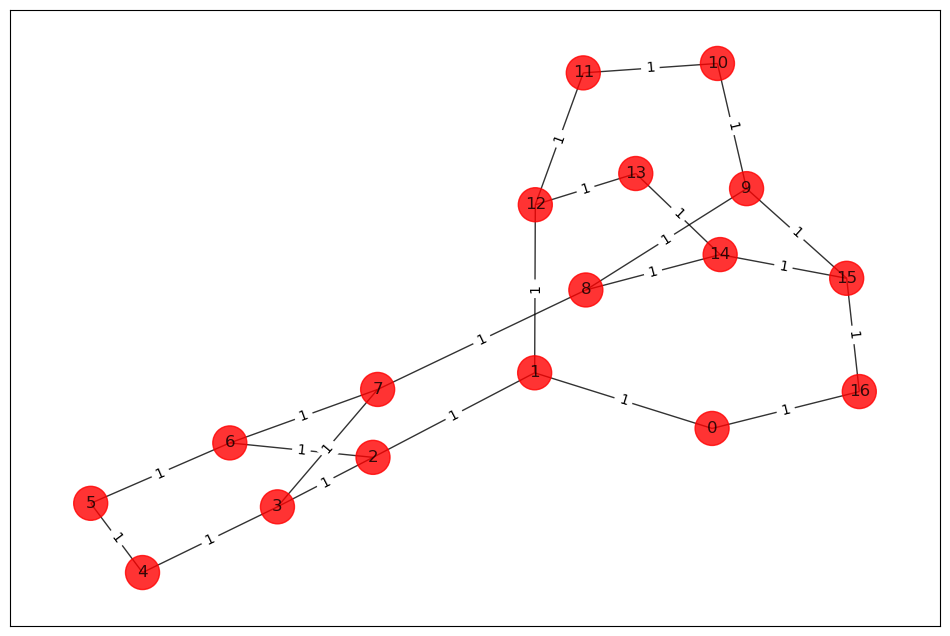

In [2]:
# Generating a graph of n nodes
n = 17  # Number of nodes in graph
G = nx.Graph()
G.add_nodes_from(np.arange(0, n, 1))
#elist = [(0, 1, 1.0), (1, 2, 1.0),(2, 3, 1.0), (3, 4,1.0),(2, 4,1.0),(0, 3,1.0),(4,5,1.0),(5,6,1.0),(6,7,1.0),(7,8,1.0),(8,9,1.0),(9,10,1.0),(10,11,1.0),(11,12,1.0),(12,13,1.0),(13,14,1.0),(14,15,1.0),(15,16,1.0),(0,16,1.0),(1,12,1),(2,6,1.0),(3,7,1.0),(14,8,1.0),(15,9,1.0)]
# tuple is (i,j,weight) where (i,j) is the edge
elist=[(0,1,1),(0,16,1),(1,12,1),(1,2,1),(2,6,1),(2,3,1),(3,7,1),(3,4,1),(4,5,1),(5,6,1),(6,7,1),(7,8,1),(8,9,1),(8,14,1),(9,10,1),(9,15,1),(10,11,1),(11,12,1),(12,13,1),(13,14,1),(14,15,1),(15,16,1)]
G.add_weighted_edges_from(elist)

colors = ["red" for node in G.nodes()]
pos = nx.spring_layout(G)
node_shape='o'
def draw_graph(G, colors, pos,node_shape):
    default_axes = plt.axes(frameon=True)
    nx.draw_networkx(G, node_color=colors, node_size=600, alpha=0.8, ax=default_axes, pos=pos,node_shape=node_shape)
    edge_labels = nx.get_edge_attributes(G, "weight")
    nx.draw_networkx_edge_labels(G, pos=pos, edge_labels=edge_labels)

import pylab

pylab.rcParams["figure.figsize"] = (12, 8)
draw_graph(G, colors, pos,node_shape)

In [3]:
w = np.zeros([n, n])
for i in range(n):
    for j in range(n):
        temp = G.get_edge_data(i, j, default=0)
        if temp != 0:
            w[i, j] = temp["weight"]
print(w)

[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]


case = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 0.0
case = [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 2.0
case = [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 3.0
case = [1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 3.0
case = [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 3.0
case = [1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 5.0
case = [0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 4.0
case = [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 4.0
case = [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 3.0
case = [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 5.0
case = [0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 6.0
case = [1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 6.0
case = [0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 4.0
case = [1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] cost = 6.0
case = [0, 1, 1, 1, 

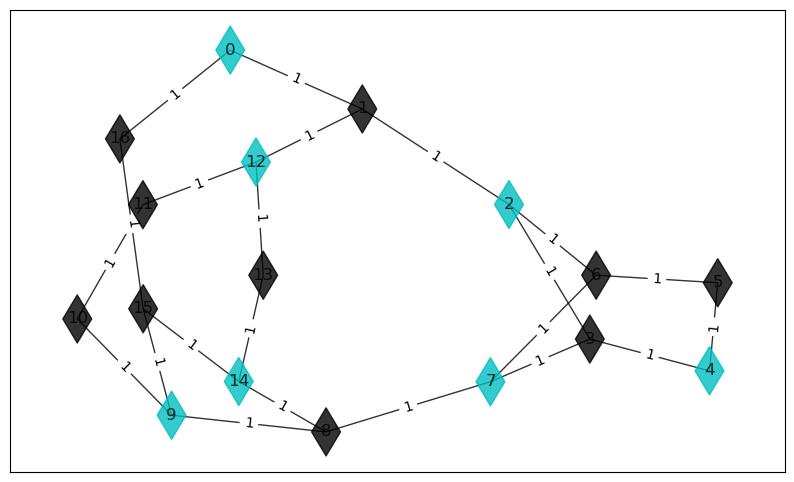

In [25]:
best_cost_brute = 0
for b in range(2**n):
    x = [int(t) for t in reversed(list(bin(b)[2:].zfill(n)))]
    cost = 0
    for i in range(n):
        for j in range(n):
            cost = cost + w[i, j] * x[i] * (1 - x[j])
    if best_cost_brute < cost:
        best_cost_brute = cost
        xbest_brute = x
    print("case = " + str(x) + " cost = " + str(cost))

colors = ["black" if xbest_brute[i] == 0 else "c" for i in range(n)]
node_shape='d'#["s" if xbest_brute[i] == 0 else "s" for i in range(n)]
draw_graph(G, colors, pos,node_shape)
print("\nBest solution = " + str(xbest_brute) + " cost = " + str(best_cost_brute))


Best solution = [1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0] cost = 19.0


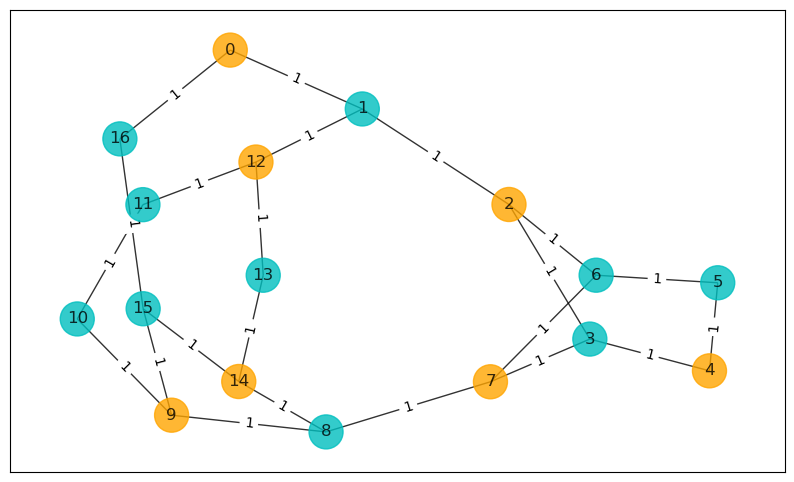

In [27]:
colors = ["c" if xbest_brute[i] == 0 else "orange" for i in range(n)]
node_shape='o'#["s" if xbest_brute[i] == 0 else "s" for i in range(n)]
draw_graph(G, colors, pos,node_shape)
print("\nBest solution = " + str(xbest_brute) + " cost = " + str(best_cost_brute))

In [4]:
max_cut = Maxcut(w)
qp = max_cut.to_quadratic_program()
print(qp.prettyprint())

Problem name: Max-cut

Maximize
  -2*x_0*x_1 - 2*x_0*x_16 - 2*x_1*x_12 - 2*x_1*x_2 - 2*x_10*x_11 - 2*x_11*x_12
  - 2*x_12*x_13 - 2*x_13*x_14 - 2*x_14*x_15 - 2*x_15*x_16 - 2*x_2*x_3
  - 2*x_2*x_6 - 2*x_3*x_4 - 2*x_3*x_7 - 2*x_4*x_5 - 2*x_5*x_6 - 2*x_6*x_7
  - 2*x_7*x_8 - 2*x_8*x_14 - 2*x_8*x_9 - 2*x_9*x_10 - 2*x_9*x_15 + 2*x_0 + 3*x_1
  + 2*x_10 + 2*x_11 + 3*x_12 + 2*x_13 + 3*x_14 + 3*x_15 + 2*x_16 + 3*x_2 + 3*x_3
  + 2*x_4 + 2*x_5 + 3*x_6 + 3*x_7 + 3*x_8 + 3*x_9

Subject to
  No constraints

  Binary variables (17)
    x_0 x_1 x_2 x_3 x_4 x_5 x_6 x_7 x_8 x_9 x_10 x_11 x_12 x_13 x_14 x_15 x_16



In [5]:
qubitOp, offset = qp.to_ising()
print("Offset:", offset)
print("Ising Hamiltonian:")
print(str(qubitOp))

Offset: -11.0
Ising Hamiltonian:
SparsePauliOp(['IIIIIIIIIIIIIIIZZ', 'ZIIIIIIIIIIIIIIIZ', 'IIIIIIIIIIIIIIZZI', 'IIIIZIIIIIIIIIIZI', 'IIIIIIIIIIIIIZZII', 'IIIIIIIIIIZIIIZII', 'IIIIIIIIIIIIZZIII', 'IIIIIIIIIZIIIZIII', 'IIIIIIIIIIIZZIIII', 'IIIIIIIIIIZZIIIII', 'IIIIIIIIIZZIIIIII', 'IIIIIIIIZZIIIIIII', 'IIIIIIIZZIIIIIIII', 'IIZIIIIIZIIIIIIII', 'IIIIIIZZIIIIIIIII', 'IZIIIIIZIIIIIIIII', 'IIIIIZZIIIIIIIIII', 'IIIIZZIIIIIIIIIII', 'IIIZZIIIIIIIIIIII', 'IIZZIIIIIIIIIIIII', 'IZZIIIIIIIIIIIIII', 'ZZIIIIIIIIIIIIIII'],
              coeffs=[0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j,
 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j,
 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j, 0.5+0.j])


In [6]:
exact = MinimumEigenOptimizer(NumPyMinimumEigensolver())
result = exact.solve(qp)
print(result.prettyprint())

objective function value: 19.0
variable values: x_0=1.0, x_1=0.0, x_2=1.0, x_3=0.0, x_4=1.0, x_5=0.0, x_6=0.0, x_7=1.0, x_8=0.0, x_9=1.0, x_10=0.0, x_11=0.0, x_12=1.0, x_13=0.0, x_14=1.0, x_15=0.0, x_16=0.0
status: SUCCESS


energy: -8.000000000000005
max-cut objective: -19.000000000000007
solution: [1. 0. 1. 1. 0. 1. 0. 0. 1. 0. 1. 0. 1. 1. 0. 1. 0.]
solution objective: 19.0


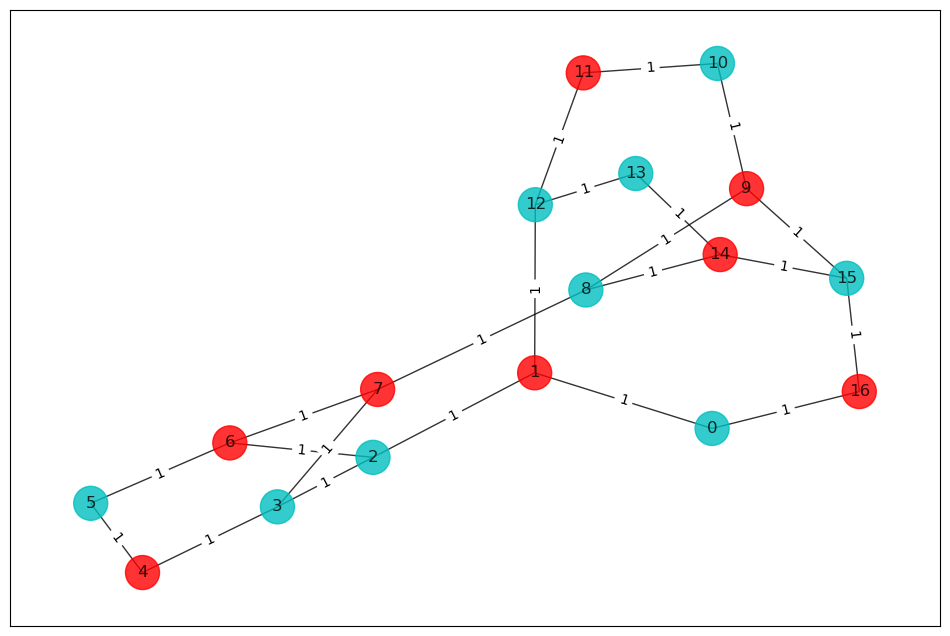

In [8]:
ee = NumPyMinimumEigensolver()
result = ee.compute_minimum_eigenvalue(qubitOp)

x = max_cut.sample_most_likely(result.eigenstate)
print("energy:", result.eigenvalue.real)
print("max-cut objective:", result.eigenvalue.real + offset)
print("solution:", x)
print("solution objective:", qp.objective.evaluate(x))


colors = ["r" if x[i] == 0 else "c" for i in range(n)]
draw_graph(G, colors, pos,node_shape)

## QAOA


In [18]:
from qiskit.algorithms.optimizers import SLSQP
from qiskit.primitives import Estimator
from qiskit.algorithms.minimum_eigensolvers import VQE 

In [29]:
estimator=Estimator()
from qiskit.circuit.library import QAOAAnsatz
optimizers = [SLSQP(maxiter=1000)]
converge_counts = np.empty([len(optimizers)], dtype=object)
converge_vals = np.empty([len(optimizers)], dtype=object)

for i, optimizer in enumerate(optimizers):
    print("\rOptimizer: {}        ".format(type(optimizer).__name__), end="")
    counts = []
    values = []
    ansatz=QAOAAnsatz(qubitOp,reps=7)

    def store_intermediate_result(eval_count, parameters, mean, std):
        counts.append(eval_count)
        values.append(mean)
     
    vqe = VQE(estimator, ansatz, optimizer, callback=store_intermediate_result)
    result = vqe.compute_minimum_eigenvalue(operator=qubitOp)
    converge_counts[i] = np.asarray(counts)
    converge_vals[i] = np.asarray(values)

print("\rOptimization complete      ")

Optimization complete      


In [37]:
ansatz.decompose().decompose().depth()

274

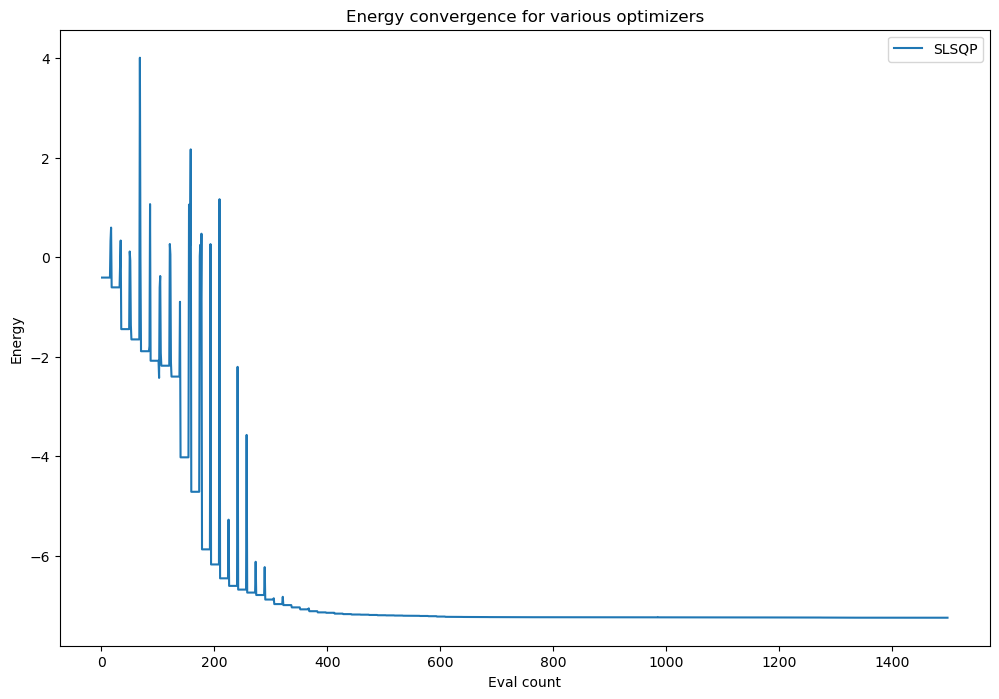

In [30]:
import pylab

pylab.rcParams["figure.figsize"] = (12, 8)
for i, optimizer in enumerate(optimizers):
    pylab.plot(converge_counts[i], converge_vals[i], label=type(optimizer).__name__)
pylab.xlabel("Eval count")
pylab.ylabel("Energy")
pylab.title("Energy convergence for various optimizers")
pylab.legend(loc="upper right");

In [33]:
print("energy:", result.eigenvalue.real)
print("time:", result.optimizer_time)

energy: -7.247249469280924
time: 2448.3089468479156


energy: -7.247249469280924
time: 2448.3089468479156
max-cut objective: -18.247249469280924
solution: [0. 1. 0. 1. 0. 0. 1. 0. 1. 0. 0. 1. 0. 1. 0. 1. 1.]
solution objective: 19.0


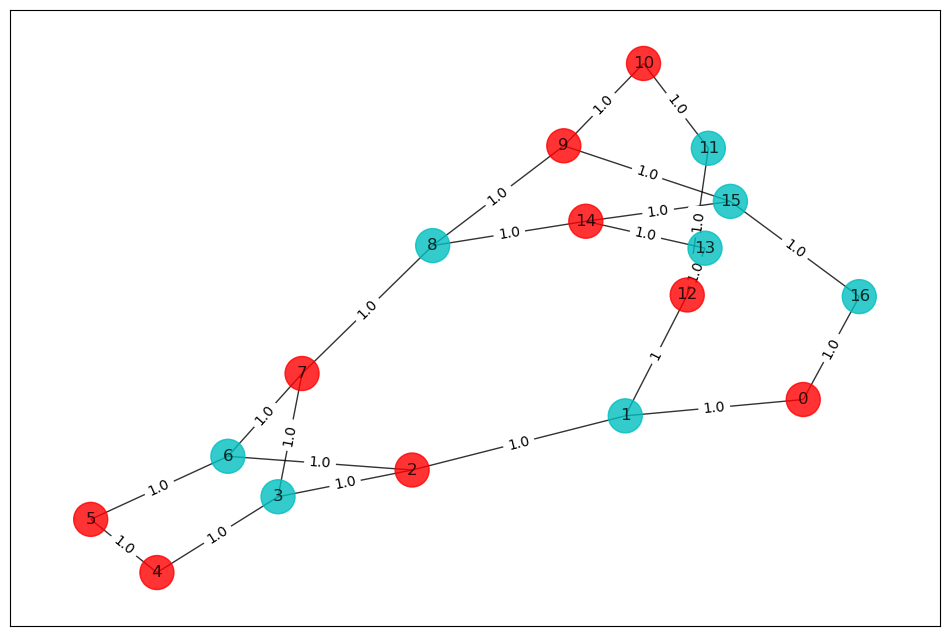

In [32]:


# print results
#x = max_cut.sample_most_likely(result.eigenstate)
print("energy:", result.eigenvalue.real)
print("time:", result.optimizer_time)
print("max-cut objective:", result.eigenvalue.real + offset)
print("solution:", x)
print("solution objective:", qp.objective.evaluate(x))

# plot results
colors = ["r" if x[i] == 0 else "c" for i in range(n)]
draw_graph(G, colors, pos)

## VQE

In [22]:
from qiskit.circuit.library import EfficientSU2

In [23]:
ansatz=EfficientSU2(n,entanglement='reverse_linear',reps=9)

In [25]:
ansatz.num_parameters

100

In [47]:
estimator=Estimator()# use this line while using statevector simulator locally
#ansatz =PauliTwoDesign(n, reps=7, seed=2)  
#we will iterate over these different optimizers
from qiskit.circuit.library import EfficientSU2
optimizers = [SLSQP(maxiter=1000)]
converge_counts = np.empty([len(optimizers)], dtype=object)
converge_vals = np.empty([len(optimizers)], dtype=object)

for i, optimizer in enumerate(optimizers):
    print("\rOptimizer: {}        ".format(type(optimizer).__name__), end="")
    counts = []
    values = []
    ansatz=EfficientSU2(n,entanglement='reverse_linear',reps=9)

    def store_intermediate_result(eval_count, parameters, mean, std):
        counts.append(eval_count)
        values.append(mean)
         
    vqe = VQE(estimator, ansatz, optimizer, callback=store_intermediate_result)
    result = vqe.compute_minimum_eigenvalue(operator=qubitOp)
    converge_counts[i] = np.asarray(counts)
    converge_vals[i] = np.asarray(values)

print("\rOptimization complete      ")

Optimization complete      


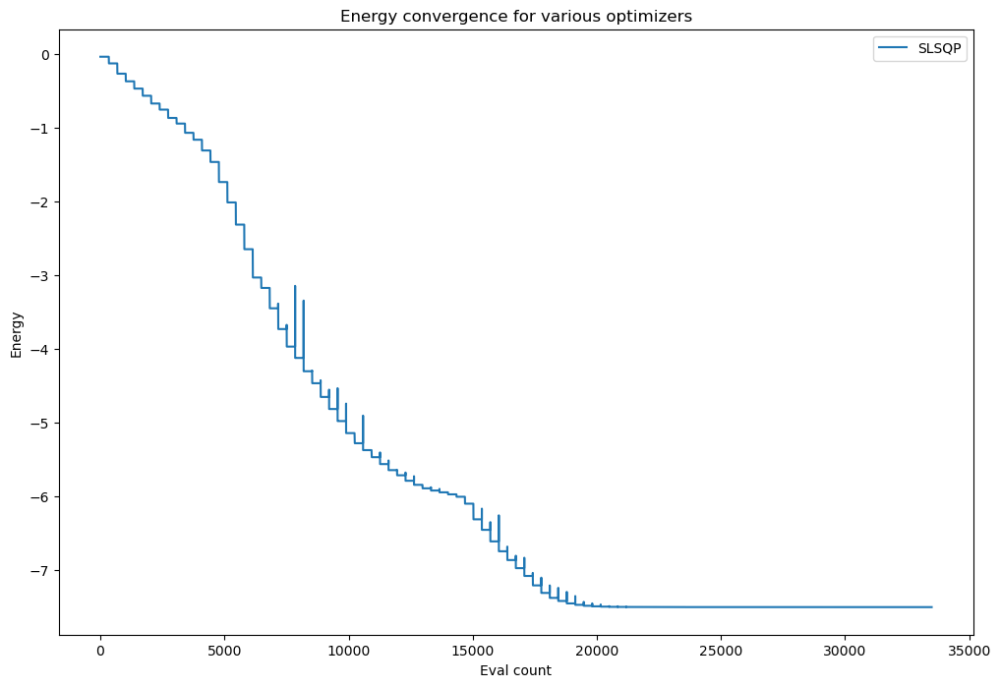

In [48]:
import pylab

pylab.rcParams["figure.figsize"] = (12, 8)
for i, optimizer in enumerate(optimizers):
    pylab.plot(converge_counts[i], converge_vals[i], label=type(optimizer).__name__)
pylab.xlabel("Eval count")
pylab.ylabel("Energy")
pylab.title("Energy convergence for various optimizers")
pylab.legend(loc="upper right");

In [49]:
print("energy:", result.eigenvalue.real)
print("time:", result.optimizer_time)

energy: -7.499986089037383
time: 77260.7184445858
